Update: 5.40 PM on 13/12/2025 - decided to improve part of the code for a better weed classification based on project by with [Open Sprayer | Transfer Learning VGG19 Grad-CAM](hhttps://www.kaggle.com/code/gallo33henrique/open-sprayer-transfer-learning-vgg19-grad-cam/notebook) from Kaggle

# Storage Mounting (Google Drive)

In [1]:
from google.colab import drive #linking to dataset
drive.mount('/content/drive')

Mounted at /content/drive


# Image Quality Checker
To Check Image Quality Before Assesment

In [ ]:
from cleanvision import Imagelab

# Specify path to folder containing the image files in your dataset
imagelab = Imagelab(data_path="/content/drive/MyDrive/Weed Classification ML/dataset/test/Narrow")

# Automatically check for a predefined list of issues within your dataset
imagelab.find_issues()

# Produce a neat report of the issues found in your dataset
imagelab.report()

# Install Libraries

In [2]:
import os # interact with operating system
import shutil
import cv2
import random
import pathlib # file paths

import numpy as np #numerical operation

from tqdm import tqdm #progress bar

#PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader

#split data
from sklearn.model_selection import train_test_split

# TensorFlow and Keras models
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

# One-hot labels
from sklearn.preprocessing import label_binarize

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg #image handling

# Evaluation metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc

import pandas as pd #data manipulation and analysis

# Database Preparation

In [5]:
# Base source folder
source_folder = '/content/drive/MyDrive/Weed Classification ML/dataset'
output_folder = '/content/drive/MyDrive/Weed Classification ML/v2'

# Classes list
classes = ['Broad', 'Narrow']

In [6]:
# List folders and files
for root, dirs, files in os.walk('/content/drive/MyDrive/Weed Classification ML/dataset', topdown=True):
  print(root, "->folders:", dirs[:5], " |files:", len(files))

/content/drive/MyDrive/Weed Classification ML/dataset ->folders: ['train', 'test', 'valid']  |files: 0
/content/drive/MyDrive/Weed Classification ML/dataset/train ->folders: ['Narrow', 'Broad']  |files: 0
/content/drive/MyDrive/Weed Classification ML/dataset/train/Narrow ->folders: []  |files: 552
/content/drive/MyDrive/Weed Classification ML/dataset/train/Broad ->folders: []  |files: 542
/content/drive/MyDrive/Weed Classification ML/dataset/test ->folders: ['Narrow', 'Broad']  |files: 0
/content/drive/MyDrive/Weed Classification ML/dataset/test/Narrow ->folders: []  |files: 92
/content/drive/MyDrive/Weed Classification ML/dataset/test/Broad ->folders: []  |files: 91
/content/drive/MyDrive/Weed Classification ML/dataset/valid ->folders: ['Narrow', 'Broad']  |files: 0
/content/drive/MyDrive/Weed Classification ML/dataset/valid/Narrow ->folders: []  |files: 276
/content/drive/MyDrive/Weed Classification ML/dataset/valid/Broad ->folders: []  |files: 271


In [ ]:
from sklearn.model_selection import train_test_split

# create folder structure
for split in ["train", "valid", "test"]:
    for cls in classes:
        os.makedirs(f"{output_folder}/{split}/{cls}", exist_ok=True)

# copy original train and valid sets
for split in ["train", "valid"]:
    for cls in classes:
        src = f"{source_folder}/{split}/{cls}"
        dst = f"{output_folder}/{split}/{cls}"
        for img in os.listdir(src):
            shutil.copy(os.path.join(src, img), dst)

# split part of train into test
test_ratio = 0.20

for cls in classes:
    src = f"{source_folder}/train/{cls}"
    imgs = [os.path.join(src, f) for f in os.listdir(src)]

    train_imgs, test_imgs = train_test_split(imgs, test_size=test_ratio, random_state=42)

    for img in test_imgs:
        shutil.copy(img, f"{output_folder}/test/{cls}")

print("OK! Train / Valid copied and Test created.")


OK! Train / Valid copied and Test created.


In [ ]:
# create folder structure
for split in ["train", "valid", "test"]:
    for cls in classes:
        os.makedirs(f"{output_base}/{split}/{cls}", exist_ok=True)

# copy original train and valid sets
for split in ["train", "valid"]:
    for cls in classes:
        src = f"{source_base}/{split}/{cls}"
        dst = f"{output_base}/{split}/{cls}"
        for img in os.listdir(src):
            shutil.copy(os.path.join(src, img), dst)

# split part of train into test
test_ratio = 0.20

for cls in classes:
    src = f"{source_base}/train/{cls}"
    imgs = [os.path.join(src, f) for f in os.listdir(src)]

    train_imgs, test_imgs = train_test_split(imgs, test_size=test_ratio, random_state=42)

    for img in test_imgs:
        shutil.copy(img, f"{output_base}/test/{cls}")

print("OK! Train / Valid copied and Test created.")

In [ ]:
# Create final structure
for split in ["train", "valid", "test"]:
    for cls in classes:
        os.makedirs(f"{output_folder}/{split}/{cls}", exist_ok=True)

# Copy original train
for cls in classes:
    src = f"{source_folder}/train/{cls}"
    dst = f"{output_folder}/train/{cls}"
    for img in os.listdir(src):
        shutil.copy(os.path.join(src, img), dst)

# Copy original valid
for cls in classes:
    src = f"{source_folder}/valid/{cls}"
    dst = f"{output_folder}/valid/{cls}"
    for img in os.listdir(src):
        shutil.copy(os.path.join(src, img), dst)

test_ratio = 0.20  # 20% for test

for cls in classes:
    src = f"{source_folder}/train/{cls}"
    imgs = [os.path.join(src, f) for f in os.listdir(src)]

    train_imgs, test_imgs = train_test_split(imgs, test_size=test_ratio, random_state=42)

    # copy test images
    for img in test_imgs:
        shutil.copy(img, f"{output_folder}/test/{cls}")

print("Test created!")
print("Train and Valid copied!")

Test created!
Train and Valid copied!


In [ ]:
# List folders and files
for root, dirs, files in os.walk(output_folder):
    print(root, len(files))

/content/drive/MyDrive/Weed Classification ML/v2 0
/content/drive/MyDrive/Weed Classification ML/v2/train 0
/content/drive/MyDrive/Weed Classification ML/v2/train/Broad 542
/content/drive/MyDrive/Weed Classification ML/v2/train/Narrow 552
/content/drive/MyDrive/Weed Classification ML/v2/valid 0
/content/drive/MyDrive/Weed Classification ML/v2/valid/Broad 271
/content/drive/MyDrive/Weed Classification ML/v2/valid/Narrow 276
/content/drive/MyDrive/Weed Classification ML/v2/test 0
/content/drive/MyDrive/Weed Classification ML/v2/test/Broad 109
/content/drive/MyDrive/Weed Classification ML/v2/test/Narrow 111


In [ ]:
# Base folder and class names
base = "/content/drive/MyDrive/Weed Classification ML/v2"
classes = ["weed", "crop"]
splits = ["train", "valid", "test"]

# Remove folders if they exist
for sp in splits:
    for cls in classes:
        p = f"{base}/{sp}/{cls}"
        if os.path.isdir(p):
            shutil.rmtree(p)
            print("Removed:", p)

In [7]:
# Training folder
train_dir = "/content/drive/MyDrive/Weed Classification ML/v2/train"
classes = ["Broad", "Narrow"]

# Count images in each class
num_broad = len(os.listdir(f"{train_dir}/Broad"))
num_narrow = len(os.listdir(f"{train_dir}/Narrow"))

print("broad:", num_broad)
print("narrow:", num_narrow)

broad: 542
narrow: 552


In [8]:
# Image size and batch size
img_size = 224
batch_size = 32

# Base folders
train_dir = "/content/drive/MyDrive/Weed Classification ML/v2/train"
valid_dir = "/content/drive/MyDrive/Weed Classification ML/v2/valid"
test_dir  = "/content/drive/MyDrive/Weed Classification ML/v2/test"

# Transfer Learning

In [9]:
# Data augmentation for training
train_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.25,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
).flow_from_directory(
    "/content/drive/MyDrive/Weed Classification ML/v2/train",
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode="categorical"
)

# Validation generator
valid_gen = ImageDataGenerator(
    rescale=1./255
).flow_from_directory(
    "/content/drive/MyDrive/Weed Classification ML/v2/valid",
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode="categorical"
)

# Test generator (no shuffle)
test_gen = ImageDataGenerator(
    rescale=1./255
).flow_from_directory(
    "/content/drive/MyDrive/Weed Classification ML/v2/test",
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)

Found 1094 images belonging to 2 classes.
Found 547 images belonging to 2 classes.
Found 220 images belonging to 2 classes.


In [25]:
# Base model
base_model = VGG19(
    include_top=False,
    weights="imagenet",
    input_shape=(img_size, img_size, 3)
)

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Classification head
x = Flatten()(base_model.output)
x = Dense(512, activation="relu")(x)
x = Dropout(0.4)(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.3)(x)
output = Dense(2, activation="softmax")(x)

# Final model
model = Model(inputs=base_model.input, outputs=output)

# Model summary
model.summary()

NameError: name 'Xception' is not defined

In [22]:
%%time

# Compile model
model.compile(optimizer=Adam(1e-4),
              loss="categorical_crossentropy",
              metrics=["accuracy"])

# Train model
history = model.fit(train_gen,
                    validation_data=valid_gen,
                    epochs=8)

Epoch 1/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 656s 19s/step - accuracy: 0.6534 - loss: 0.6897 - val_accuracy: 0.9452 - val_loss: 0.1573
Epoch 2/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 672s 19s/step - accuracy: 0.8964 - loss: 0.2198 - val_accuracy: 0.9689 - val_loss: 0.0837
Epoch 3/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 644s 19s/step - accuracy: 0.9395 - loss: 0.1496 - val_accuracy: 0.9744 - val_loss: 0.0756
Epoch 4/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 690s 20s/step - accuracy: 0.9386 - loss: 0.1431 - val_accuracy: 0.9616 - val_loss: 0.1000
Epoch 5/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 638s 18s/step - accuracy: 0.9464 - loss: 0.1246 - val_accuracy: 0.9452 - val_loss: 0.1243
Epoch 6/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 638s 18s/step - accuracy: 0.9601 - loss: 0.1161 - val_accuracy: 0.9744 - val_loss: 0.0603
Epoch 7/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 638s 18s/step - accuracy: 0.9676 - loss: 0.1080 - val_accuracy: 0.9634 - val_loss: 0.0760
Epoch 8/8
35/35 ━━━━━━━━━━━━━━━━━━━━ 691s 20s/step - accuracy: 0.9641 - loss: 0.0758 - val_accuracy: 0.9854 - v

# Load Model (If already trained)

In [23]:
# Save VGG19 neural network
model.save("/content/drive/My Drive/Weed Classification ML/Model/VGG16.keras")

In [46]:
# Load already trained model (optional)
from tensorflow.keras.models import load_model
model = load_model('/content/drive/My Drive/Weed Classification ML/Model/VGG16.keras')

# Model Preparation

In [27]:
# Generate predictions on the test set
pred = model.predict(test_gen)

# True labels
y_true = test_gen.classes
pred_prob = model.predict(test_gen)
y_pred = np.argmax(pred_prob, axis=1)
y_true = test_gen.classes

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 90s 13s/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 87s 12s/step


# Evaluation Metric

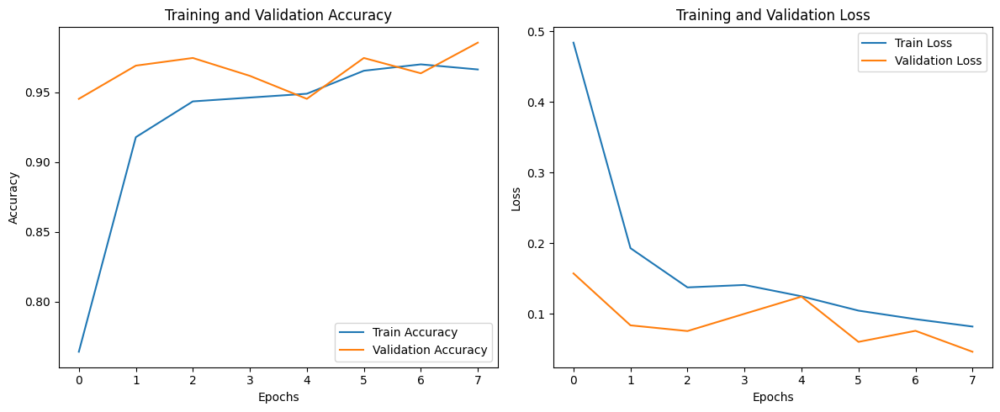

In [28]:
# Extract training history
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]

epochs_range = range(len(acc))

# Plot accuracy
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label="Train Accuracy")
plt.plot(epochs_range, val_acc, label="Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label="Train Loss")
plt.plot(epochs_range, val_loss, label="Validation Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [29]:
# Show final numeric performance
# Show best epoch automatically
best_epoch = val_acc.index(max(val_acc)) + 1

print("Best Epoch:", best_epoch)
print(f"Best Validation Accuracy: {max(val_acc):.4f}")
print(f"Final Training Accuracy  : {acc[-1]:.4f}")
print(f"Final Validation Accuracy: {val_acc[-1]:.4f}")
print(f"Final Training Loss      : {loss[-1]:.4f}")
print(f"Final Validation Loss    : {val_loss[-1]:.4f}")

Best Epoch: 8
Best Validation Accuracy: 0.9854
Final Training Accuracy  : 0.9662
Final Validation Accuracy: 0.9854
Final Training Loss      : 0.0820
Final Validation Loss    : 0.0463


In [30]:
# Classification report
predictions = model.predict(test_gen)
y_pred = np.argmax(predictions, axis=1)
y_true = test_gen.classes

print(classification_report(y_true, y_pred, target_names=test_gen.class_indices.keys()))

7/7 ━━━━━━━━━━━━━━━━━━━━ 86s 12s/step
              precision    recall  f1-score   support

       Broad       1.00      0.99      1.00       109
      Narrow       0.99      1.00      1.00       111

    accuracy                           1.00       220
   macro avg       1.00      1.00      1.00       220
weighted avg       1.00      1.00      1.00       220



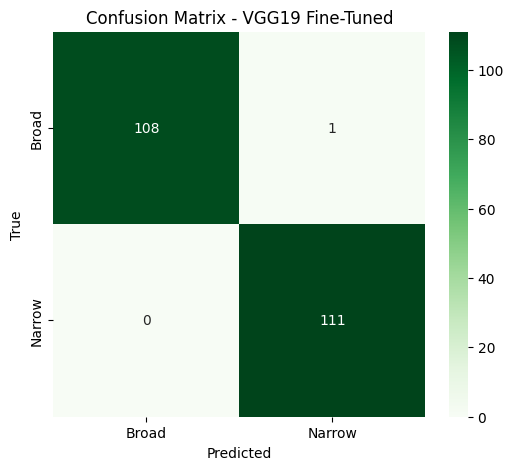

In [31]:
# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens",
            xticklabels=test_gen.class_indices.keys(),
            yticklabels=test_gen.class_indices.keys())
plt.title("Confusion Matrix - VGG19 Fine-Tuned")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


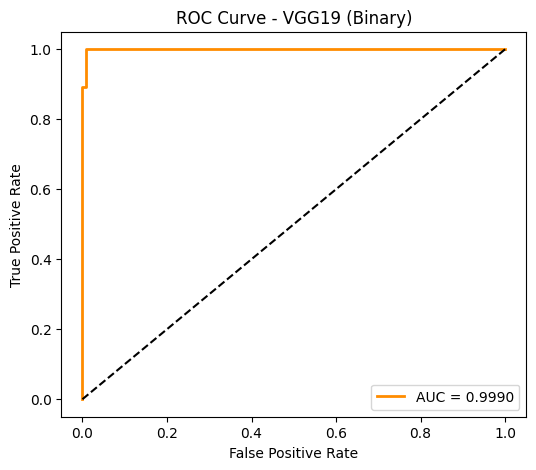

In [32]:
# Get probability of class 1 (positive class)
y_scores = pred[:, 1]

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_scores)

# Compute AUC
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.4f}", color="darkorange")
plt.plot([0,1], [0,1], 'k--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - VGG19 (Binary)")
plt.legend()
plt.show()

In [33]:
# Predictions
pred = model.predict(test_gen)

# True labels
y_true = test_gen.classes
y_true_bin = label_binarize(y_true, classes=[0,1])   # shape (1207, 1)

# Binary ROC AUC
fpr, tpr, _ = roc_curve(y_true, pred[:,1])
auc_binario = auc(fpr, tpr)

# One-vs-One AUC (per class)
roc_auc = {}

# Class docks as positive
fpr0, tpr0, _ = roc_curve(y_true == 0, pred[:,0])
roc_auc[0] = auc(fpr0, tpr0)

# Class notdocks as positive
fpr1, tpr1, _ = roc_curve(y_true == 1, pred[:,1])
roc_auc[1] = auc(fpr1, tpr1)

# Macro-average AUC
roc_auc_macro = (roc_auc[0] + roc_auc[1]) / 2

# Micro-average AUC (binary = general AUC)
fpr_micro, tpr_micro, _ = roc_curve(y_true, pred[:,1])
roc_auc_micro = auc(fpr_micro, tpr_micro)

print(roc_auc)
print("Macro-average AUC:", roc_auc_macro)
print("Micro-average AUC:", roc_auc_micro)
print("Binary AUC:", auc_binario)

7/7 ━━━━━━━━━━━━━━━━━━━━ 85s 12s/step
{0: np.float64(0.999008182494421), 1: np.float64(0.999008182494421)}
Macro-average AUC: 0.999008182494421
Micro-average AUC: 0.999008182494421
Binary AUC: 0.999008182494421


In [34]:
# Precision, Recall, F1-score
precision = precision_score(y_true, y_pred, average="binary")
recall = recall_score(y_true, y_pred, average="binary")
f1 = f1_score(y_true, y_pred, average="binary")

print("Precision :", precision)
print("Recall    :", recall)
print("F1-score  :", f1)
print()
print("Macro Precision:", precision_score(y_true, y_pred, average="macro"))
print("Macro Recall:", recall_score(y_true, y_pred, average="macro"))
print("Macro F1:", f1_score(y_true, y_pred, average="macro"))

Precision : 0.9910714285714286
Recall    : 1.0
F1-score  : 0.9955156950672646

Macro Precision: 0.9955357142857143
Macro Recall: 0.9954128440366973
Macro F1: 0.9954537000681944


# Image Prediction

In [47]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np
import os, random

def show_predictions(model, folder, img_size=224, n_images=9):
    files = os.listdir(folder)
    files = random.sample(files, n_images)

    plt.figure(figsize=(12, 12))

    for i, fname in enumerate(files):

        img_path = f"{folder}/{fname}"

        img = image.load_img(img_path, target_size=(img_size, img_size))
        img_array = image.img_to_array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        pred = model.predict(img_array, verbose=0)
        pred_class = np.argmax(pred)
        prob = pred[0][pred_class]

        label = "Broad" if pred_class == 0 else "Narrow"

        # build title text like: docks (0.97)
        title = f"{label} ({prob:.2f})"

        plt.subplot(3, 3, i+1)
        plt.imshow(img)
        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


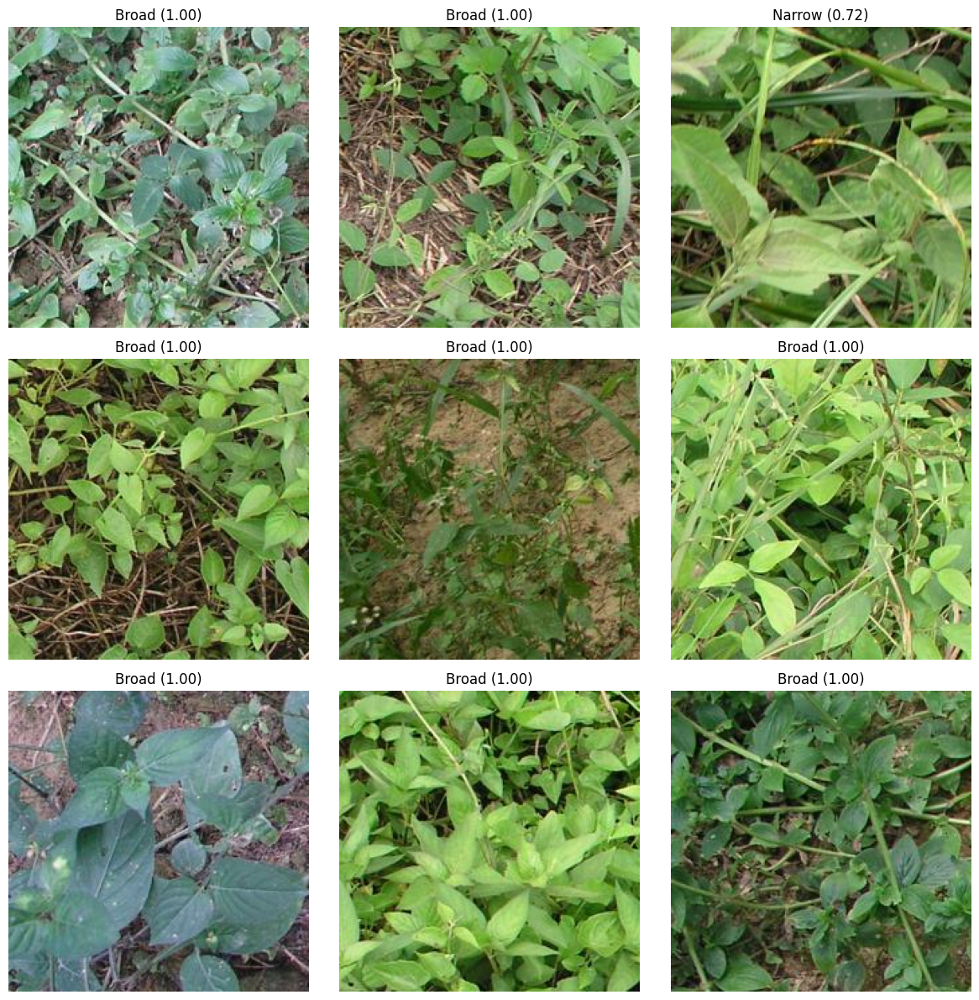

In [48]:
# Test folder path
test_path = "/content/drive/MyDrive/Weed Classification ML/v2/valid/Broad"

# Show sample predictions
show_predictions(model, test_path, n_images=9)

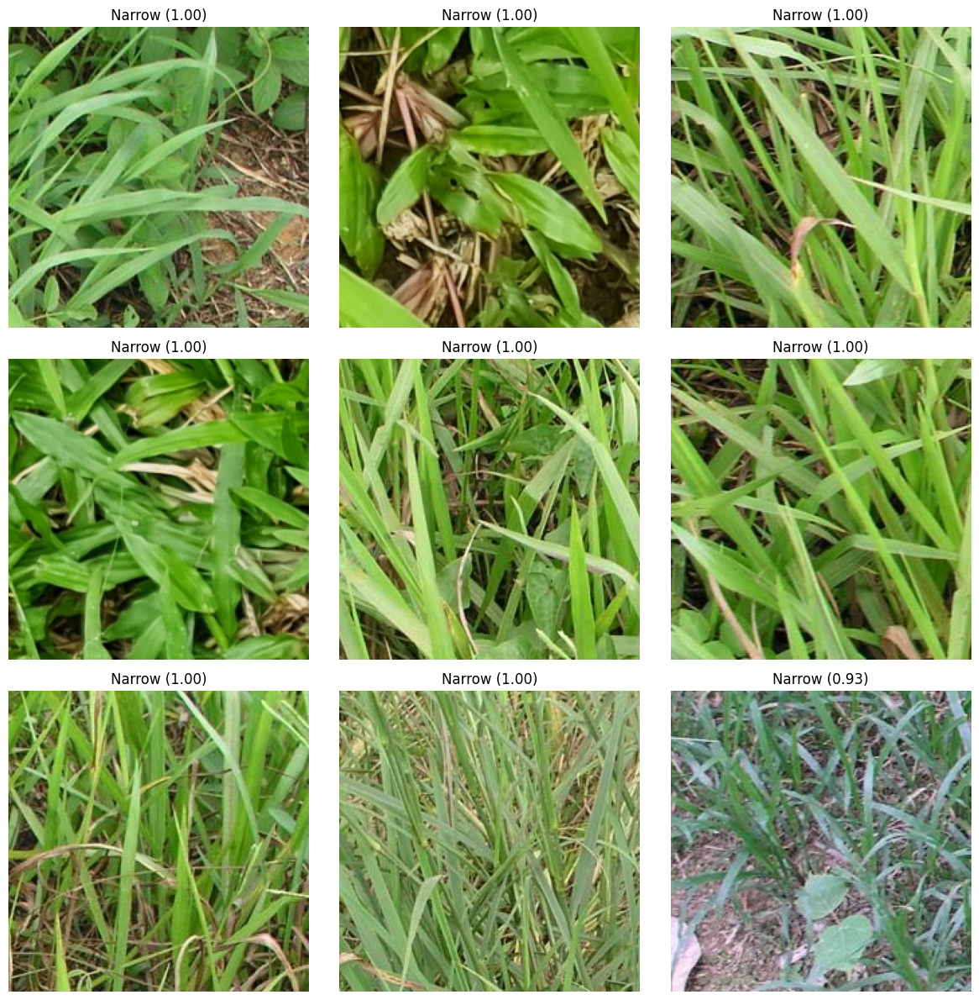

In [37]:
# Show sample predictions for notdocks
test_path = "/content/drive/MyDrive/Weed Classification ML/v2/valid/Narrow"
show_predictions(model, test_path, n_images=9)

In [38]:
#
path = "/content/drive/MyDrive/Weed Classification ML/v2/"

#
files = os.listdir(path)

print("Total imagens:", len(files))
print(files[:10])   # mostrar primeiras 10

Total imagens: 3
['train', 'valid', 'test']


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
Class: Narrow — Accuracy: 0.9997


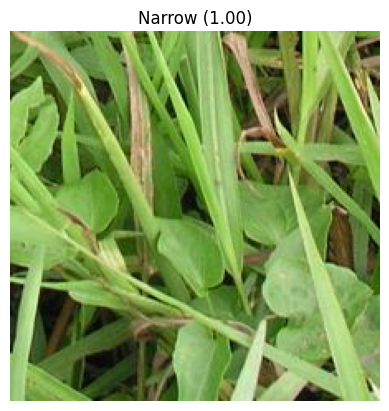

In [39]:
#Manually picked image to predict
def predict_image(path):
    img = cv2.imread(path)

    if img is None:
        print(f"Error: No image found -> {path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (img_size, img_size)) / 255.0

    input_tensor = np.expand_dims(img_resized, axis=0)

    pred = model.predict(input_tensor)
    cls = np.argmax(pred)
    conf = pred[0][cls]

    labels = list(test_gen.class_indices.keys())

    print(f"Class: {labels[cls]} — Accuracy: {conf:.4f}")

    plt.imshow(img_rgb)
    plt.title(f"{labels[cls]} ({conf:.2f})")
    plt.axis("off")
    plt.show()


#
predict_image("/content/drive/My Drive/Weed Classification ML/v2/valid/Narrow/Narrow47.png")


Tested: Broad580.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
Class: Broad — Accuracy: 0.9997


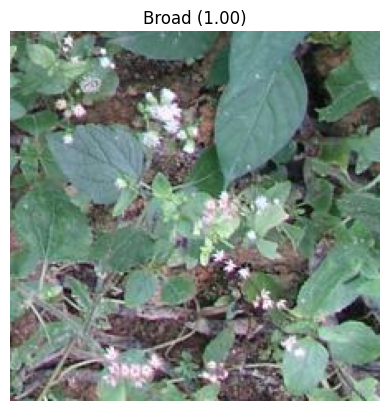


Tested: Broad134.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
Class: Broad — Accuracy: 1.0000


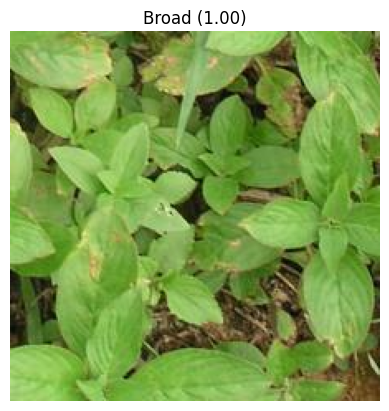


Tested: Broad59.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step
Class: Broad — Accuracy: 0.9993


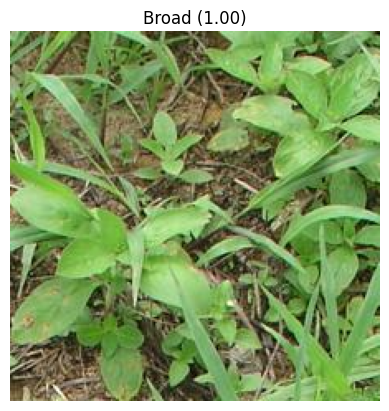


Tested: Broad874.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
Class: Broad — Accuracy: 1.0000


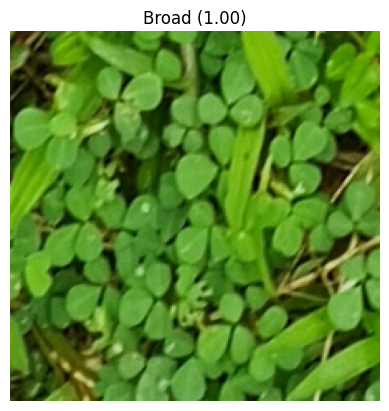


Tested: Broad22.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
Class: Broad — Accuracy: 0.9999


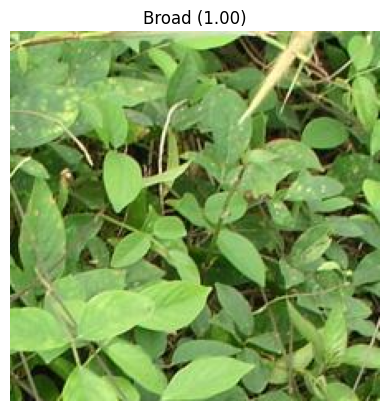

In [40]:
# Randomly picked and predict Broad leaves classes
import os, random

test_broad = "/content/drive/My Drive/Weed Classification ML/v2/valid/Broad"

files = os.listdir(test_broad)

samples = random.sample(files, min(5, len(files)))

for f in samples:
    print("\nTested:", f)
    predict_image(f"{test_broad}/{f}")


Tested: Narrow100.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step
Class: Narrow — Accuracy: 0.9994


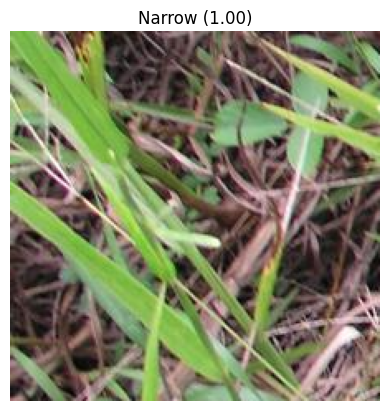


Tested: Narrow410.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Class: Narrow — Accuracy: 0.9253


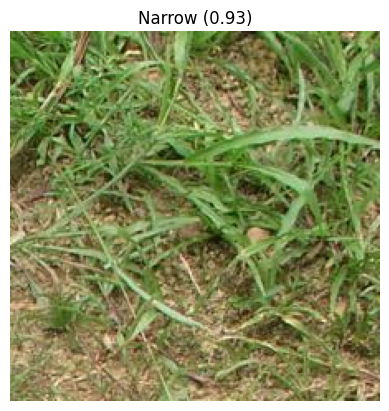


Tested: Narrow117.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
Class: Narrow — Accuracy: 0.9995


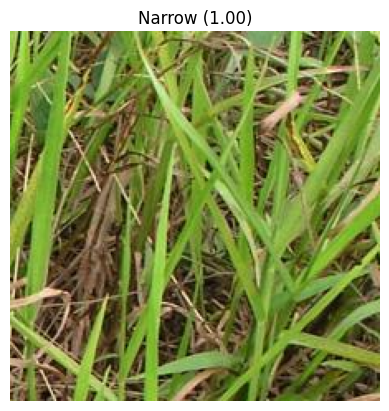


Tested: Narrow506.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
Class: Narrow — Accuracy: 1.0000


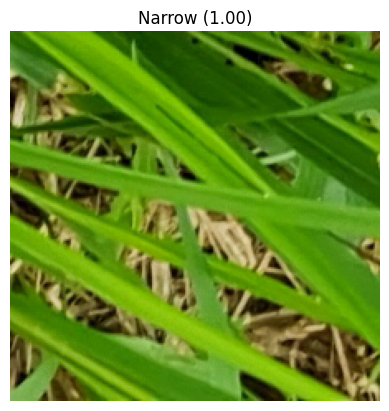


Tested: Narrow610.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
Class: Narrow — Accuracy: 0.9998


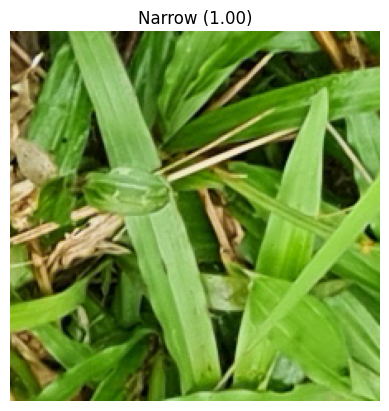

In [41]:
#Random pick and predict Narrow Leaves classes
test_narrow = "/content/drive/My Drive/Weed Classification ML/v2/valid/Narrow"

files = os.listdir(test_narrow)

samples = random.sample(files, min(5, len(files)))

for f in samples:
    print("\nTested:", f)
    predict_image(f"{test_narrow}/{f}")

In [51]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.vgg19 import preprocess_input

# Load model
model = load_model("/content/drive/My Drive/Weed Classification ML/Model/VGG16.keras")
print("Model loaded!")

Model loaded!


In [54]:
model = tf.keras.models.load_model("/content/drive/My Drive/Weed Classification ML/Model/VGG16.keras")
print("Model loaded!")

# List layers
for l in model.layers:
    print(l.name)

Model loaded!
input_layer_3
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
flatten_3
dense_9
dropout_6
dense_10
dropout_7
dense_11


In [55]:
# Define the last convolutional layer of VGG19
last_conv_layer_name = "block5_conv3"
last_conv_layer = model.get_layer(last_conv_layer_name)

In [58]:
# Grad-CAM function
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):

    grad_model = tf.keras.models.Model(
        [model.inputs],
        [
            model.get_layer(last_conv_layer_name).output,
            model.output
        ]
    )

    with tf.GradientTape() as tape:
        conv_outputs, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        pred_value = preds[0][pred_index]

    grads = tape.gradient(pred_value, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Prediction and display
def predict_with_gradcam(img_path, model, img_size=224):

    img = image.load_img(img_path, target_size=(img_size, img_size))
    img_np = image.img_to_array(img)

    x = np.expand_dims(img_np, axis=0)
    x = preprocess_input(x)

    preds = model.predict(x, verbose=0)
    pred_idx = np.argmax(preds)
    prob = preds[0][pred_idx]

    class_names = ["Broad","Narrow"]
    label = class_names[pred_idx]

    heatmap = make_gradcam_heatmap(x, model, "block5_conv3")

    heatmap = np.uint8(255 * heatmap)
    heatmap = np.stack([heatmap]*3, axis=-1)
    heatmap = tf.image.resize(heatmap, (img_size, img_size)).numpy()

    overlay = (0.6*heatmap + img_np) / 255.0
    overlay = np.squeeze(overlay)

    plt.figure(figsize=(10,4))

    plt.subplot(1,2,1)
    plt.imshow(img_np.astype("uint8"))
    plt.title(f"{label} ({prob:.2f})")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(overlay)
    plt.title("Grad-CAM")
    plt.axis("off")

    plt.show()

# Image Preview with Grad-CAM

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_3']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


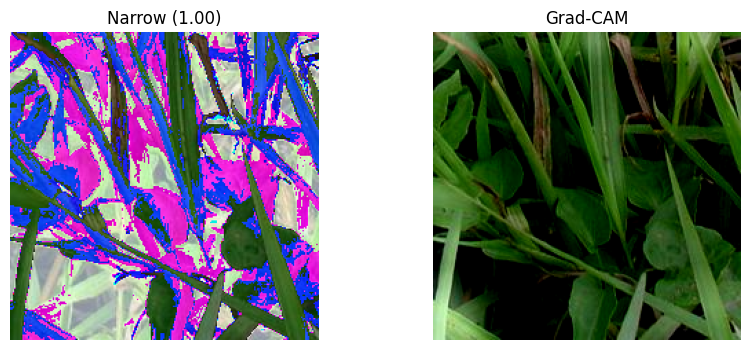

In [59]:
predict_with_gradcam(
    "/content/drive/My Drive/Weed Classification ML/v2/valid/Narrow/Narrow47.png",
    model
)

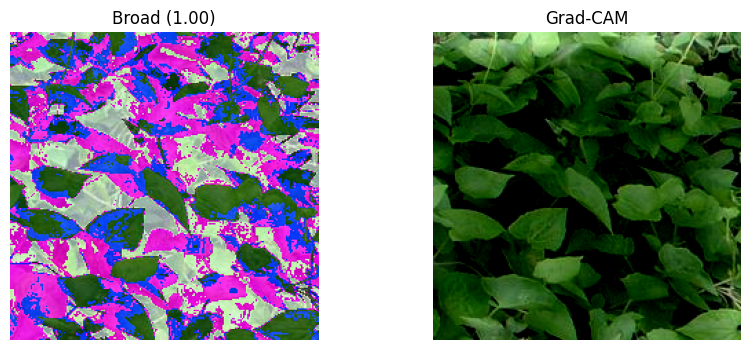

In [60]:
predict_with_gradcam(
    "/content/drive/My Drive/Weed Classification ML/v2/valid/Broad/Broad5.png",
    model
)